# Run run_TCZE_REF_TSNB_ALL

TCZERO bug corrected (over the snow-free fraction; https://gitlab.com/cccma/classic/-/issues/119)

Test TCZERO bellow the snow pack and computation of TSNBOT

- **TCZERO** ([soilHeatFluxPrep.f90](https://gitlab.com/cccma/classic/-/blob/master/src/soilHeatFluxPrep.f90?ref_type=heads#L124))

```
      if (ZSNOW(I) > 0.0) then
        !! TCZE_REF
        ! TCZERO = 1.0 / (0.5 / TCSNOW(I) + 0.5 / TCTOP(I,1))
        !! TCZE_OP1
        ! TCZERO = TCTOP(I,1)
        !! TCZE_OP2
        ! TCZERO = (1.0/ZSNOW(I) + 1.0/DELZ(1)) / ((1.0/ZSNOW(I))/TCSNOW(I) + (1.0/DELZ(1))/TCTOP(I,1))
        !! TCZE_OP3
        ! TCZERO = (ZSNOW(I) + DELZ(1)) / (ZSNOW(I)/TCSNOW(I) + DELZ(1)/TCTOP(I,1))
      else
        TCZERO = TCTOP(I,1)
      end if
```

- **TSNBOT** ([snowTempUpdate.f90](https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139))

```
      !! TSNB_REF
      ! TSNBOT(I) = (ZSNOW(I) * TSNOW(I) + DELZ(1) * TBAR(I,1)) / &
      !             (ZSNOW(I) + DELZ(1))
      !! TSNB_OP1
      ! TSNBOT(I) = (1 / ZSNOW(I) * TSNOW(I) + 1 / DELZ(1) * TBAR(I,1)) / &
      !             (1 / ZSNOW(I) + 1 / DELZ(1))
      !! TSNB_OP2
      ! TSNBOT(I) = (TCSNOW(I) / ZSNOW(I) * TSNOW(I) + TCTOP(I,1) / DELZ(1) * TBAR(I,1)) / &
      !             (TCSNOW(I) / ZSNOW(I) + TCTOP(I,1) / DELZ(1))
      !! TSNB_OP3
      !! Same as in src/soilHeatFluxPrep.f90
      !! TCZE_REF
      ! TCZERO = 1.0 / (0.5 / TCSNOW(I) + 0.5 / TCTOP(I,1))
      !! TCZE_OP1
      ! TCZERO = TCTOP(I,1)
      !! TCZE_OP2
      ! TCZERO = (1.0/ZSNOW(I) + 1.0/DELZ(1)) / ((1.0/ZSNOW(I))/TCSNOW(I) + (1.0/DELZ(1))/TCTOP(I,1))
      !! TCZE_OP3
      ! TCZERO = (ZSNOW(I) + DELZ(1)) / (ZSNOW(I)/TCSNOW(I) + DELZ(1)/TCTOP(I,1))
      ! TSNBOT(I) = (TCSNOW(I) / ZSNOW(I) * TSNOW(I) + TCZERO / DELZ(1) * TBAR(I,1)) / &
                  (TCSNOW(I) / ZSNOW(I) + TCZERO / DELZ(1))
      !! TSNB_OP4
      ! TSNBOT(I) = 0.2*TSNOW(I)+0.8*TBAR(I,1)
      !! TSNB_OP5
      ! TSNBOT(I) = TSURF(I)-GSNOLD*ZSNOW(I)/(2.0*TCSNOW(I))

```


In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xskillscore as xs
import calendar
import os

In [2]:
site = 'cdp'
site_longname = 'Col de Porte, France'
y_start = 2002
y_end = 2014

# labels = ['peat_30min_ext', 'peat']
labels = [
    'TCZE_REF_TSNB_REF', 
    'TCZE_REF_TSNB_OP1', 
    'TCZE_REF_TSNB_OP2', 
    'TCZE_REF_TSNB_OP3', 
    'TCZE_REF_TSNB_OP4', 
    'TCZE_REF_TSNB_OP5', 
]

root_path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowMIP/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

# ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
# ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
# ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [3]:
path = "/home/lalandmi/eccc/classic-develop/inputFiles/SnowMIP/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_Ref.nc')

In [4]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [5]:
for i in range(len(labels)):
    # ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    # ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    # ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

Text(0.5, 0.98, 'Col de Porte, France')

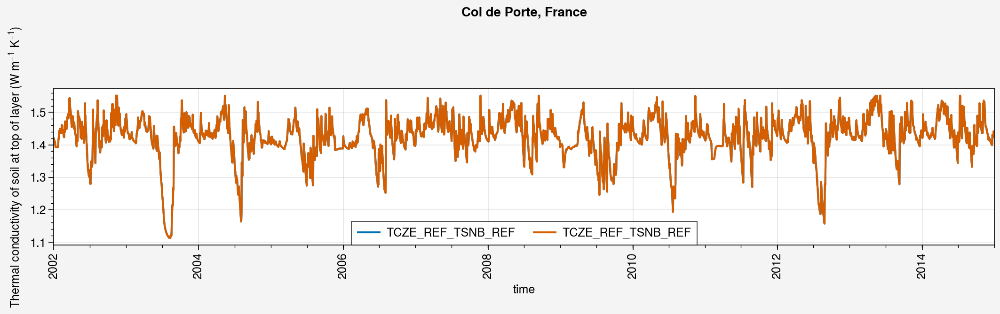

In [12]:
%matplotlib inline
fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list[0:1], labels[0:1]):
    axs[0].plot(ds_d.tctop.isel(layer=2), label=label)
    axs[0].plot(ds_d.tcbot.isel(layer=2), label=label)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Col de Porte, France')

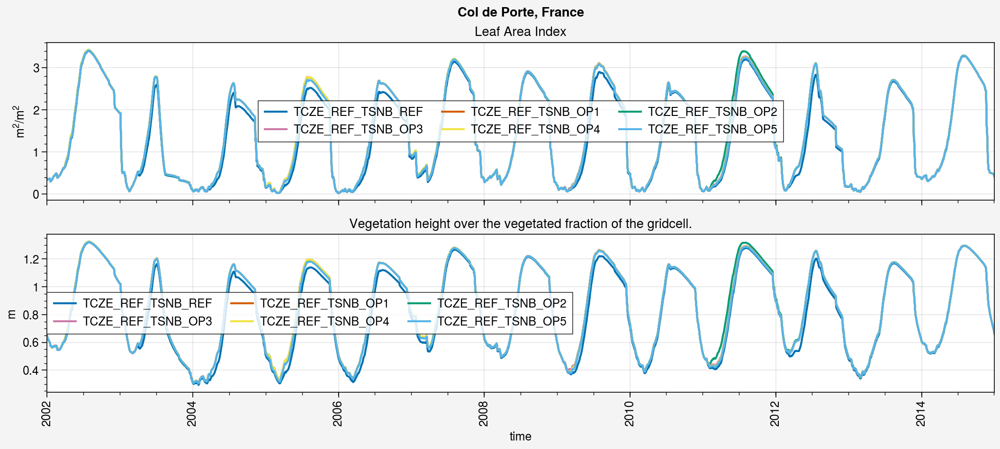

In [231]:
%matplotlib inline
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.lai, label=label)
    axs[1].plot(ds_d.vegHeight, label=label)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Col de Porte, France (2002-2014)')

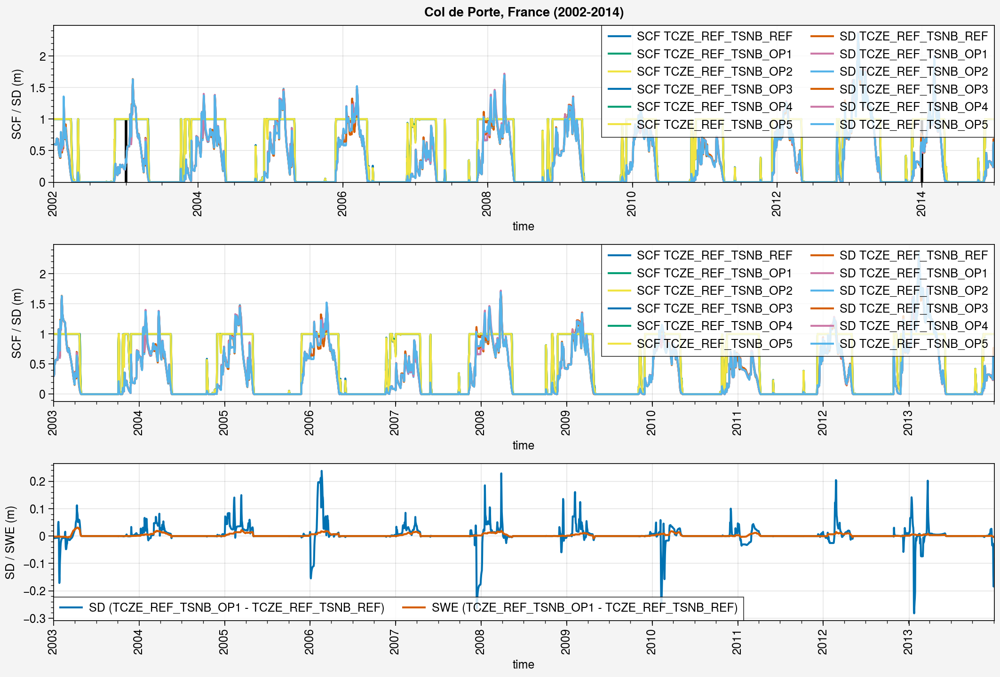

In [232]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+1)
end = str(y_end-1)

for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


## Compare with obs

In [27]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'

ds_h_obs = xr.open_dataset(path_obs+'/obs_insitu_'+site+'_1994_'+str(y_end)+'.nc').load()
ds_d_obs = ds_h_obs.resample(time='D').mean().load()
ds_h_obs

<xarray.Dataset> Size: 8MB
Dimensions:   (time: 175320, sdepth: 3)
Coordinates:
  * time      (time) datetime64[ns] 1MB 1994-10-01T01:00:00 ... 2014-10-01
  * sdepth    (sdepth) float32 12B 0.1 0.2 0.5
Data variables:
    albs      (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snd_auto  (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snd_man   (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snw_auto  (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snw_man   (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    ts        (time) float32 701kB 11.12 9.668 8.029 ... 7.532 7.532 8.029
    tsl       (time, sdepth) float32 2MB 11.95 12.28 12.23 ... 12.95 12.83 12.8

### SD

In [25]:
tot_year = y_end - y_start + 1
gap = 6
years = pplt.arange(y_start, y_end)
years

array([2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014])

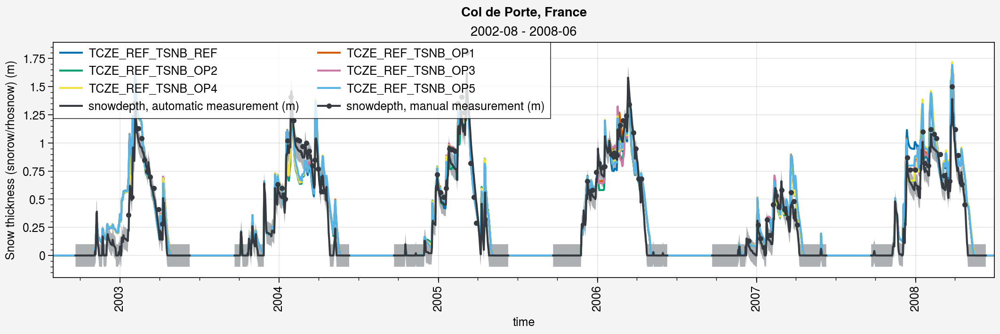

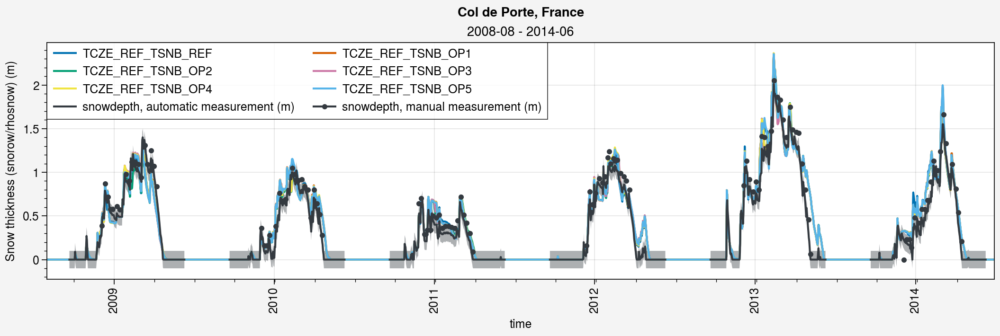

In [233]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


### SWE

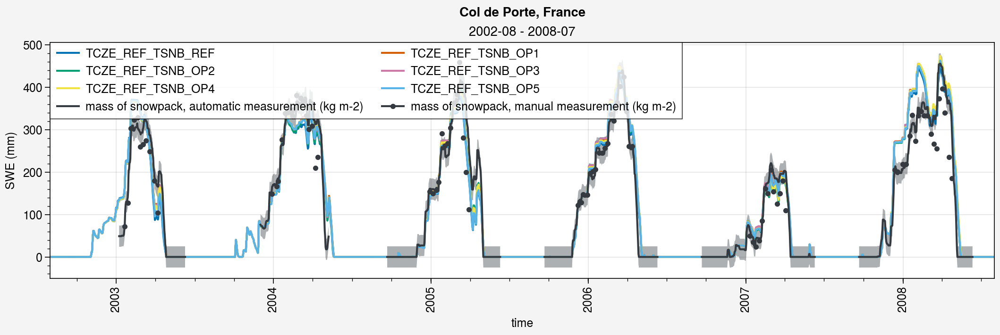

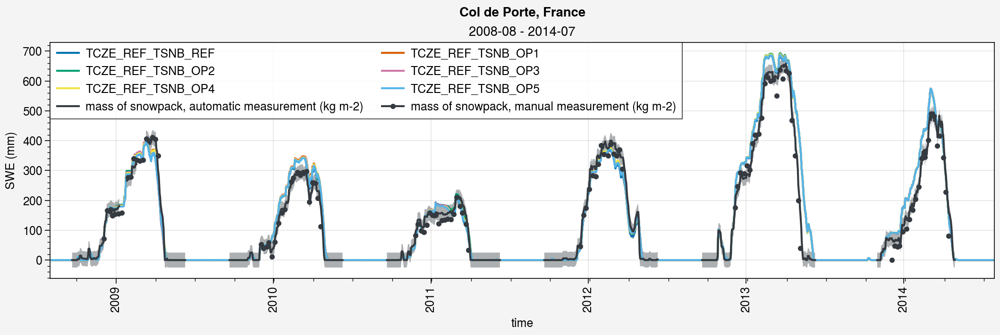

In [234]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snw.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values+25, axis=0),
        np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    axs[0].plot(ds_d_obs.snw_man.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')
    
    fig.suptitle(site_longname)


### Albedo

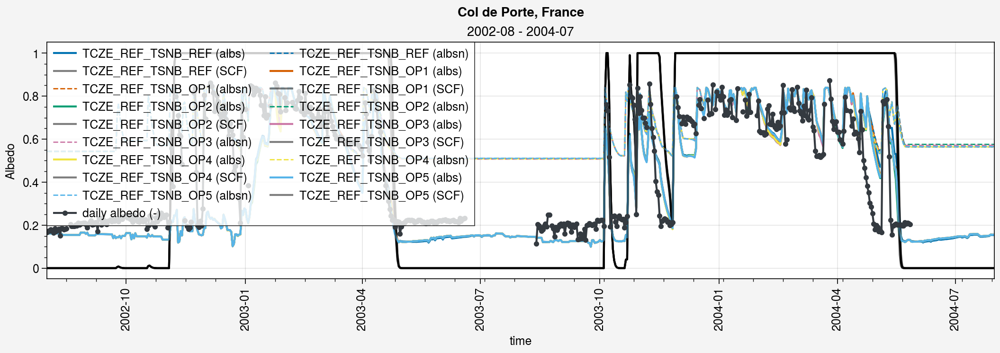

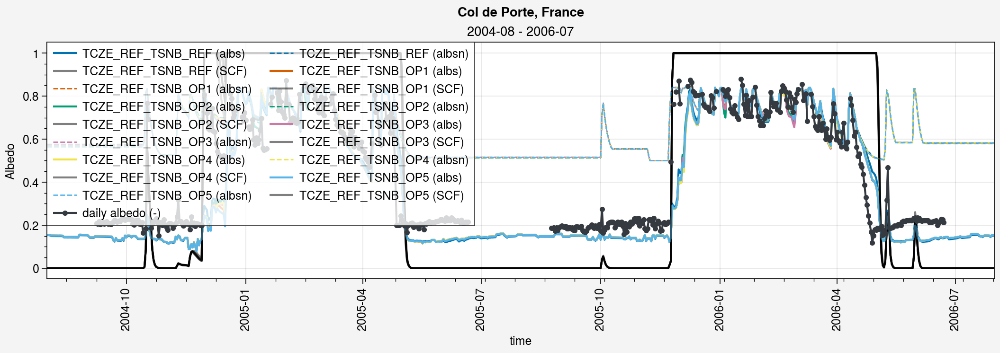

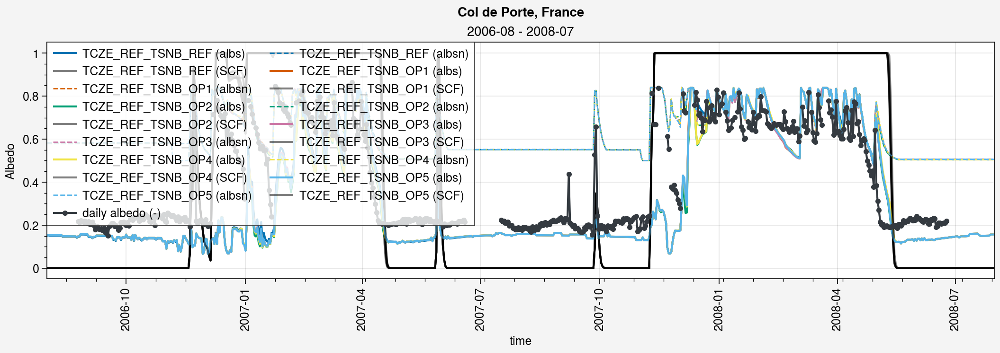

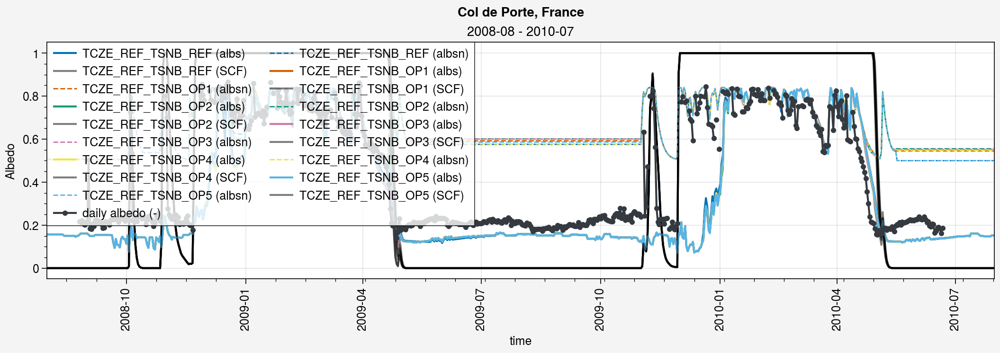

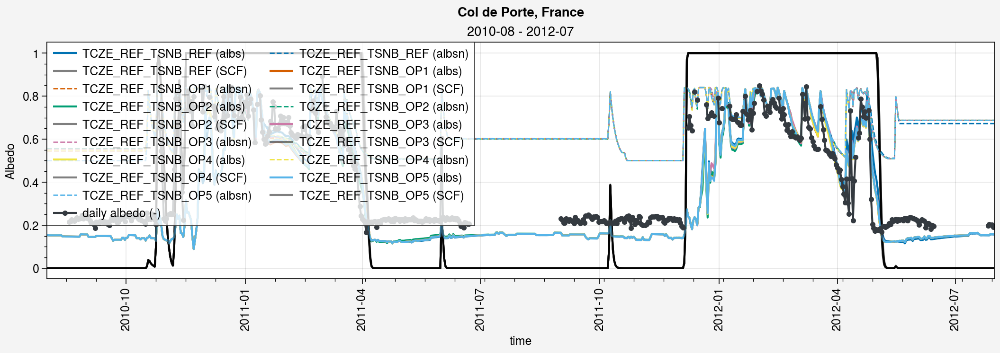

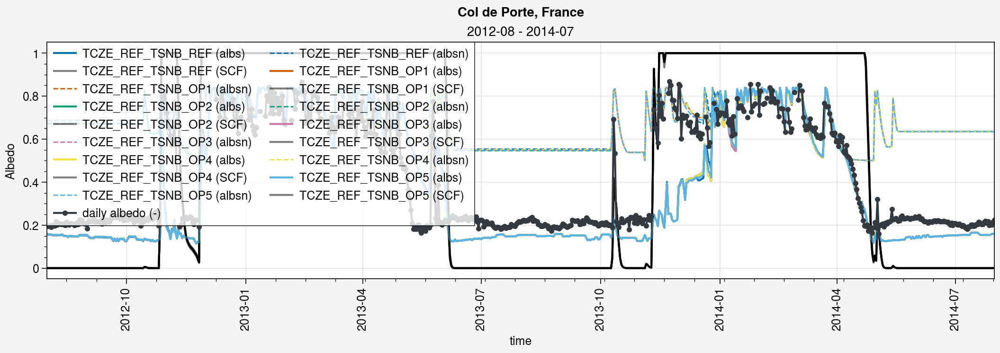

In [235]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    k = 0
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(k))
        axs[0].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(k), ls='--', lw=1)
        axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
        
        k+=1
    
    # Obs
    axs[0].plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Albedo')
    
    fig.suptitle(site_longname)


### Surface Temperature

Domine et al. ([2019](https://onlinelibrary.wiley.com/doi/abs/10.1029/2018MS001445)): "**Averaged over a period of several days the surface temperatures are essentially the same**. The amplitude variations are greater in the Alpine snowpack (Figure 8b) because the insulating layer at the top does not allow damping the air temperature variations by heat exchanges with the snowpack. This effect is more important in April and May, when daily temperature variations reach 20 °C, sometimes more. The absolute temperature differences reaches 4.7 °C on 8 February, when the temperature suddenly increases by 15 °C in 5 hr, and the surface temperature of the Alpine snowpack increases more rapidly."

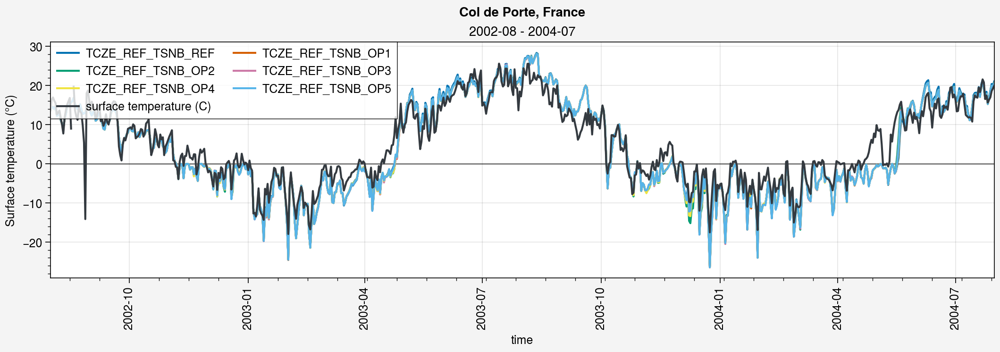

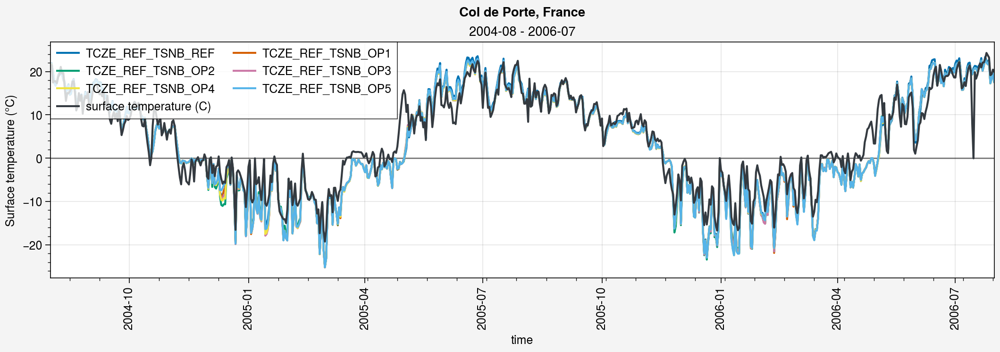

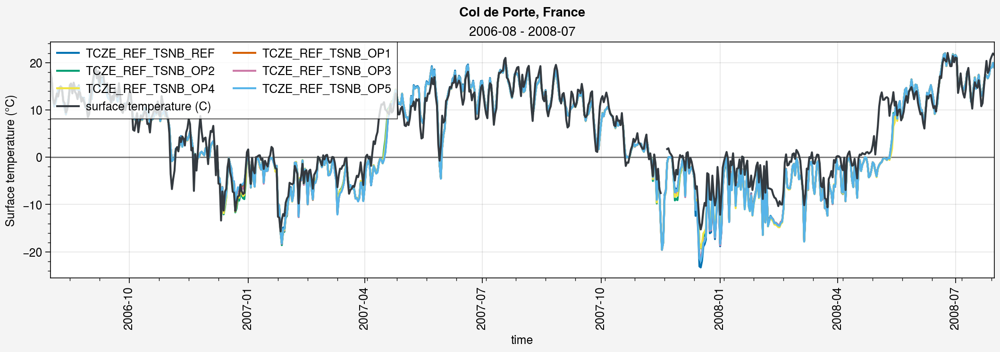

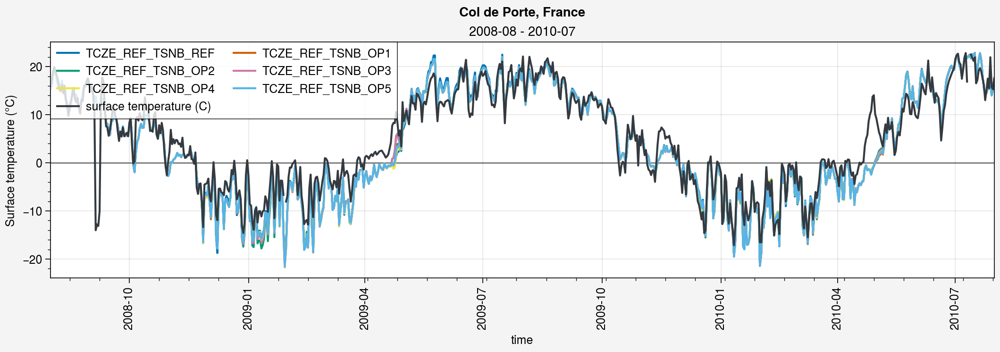

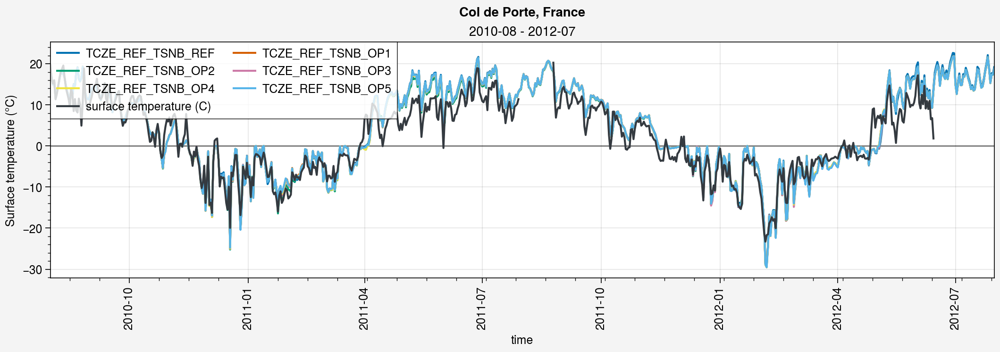

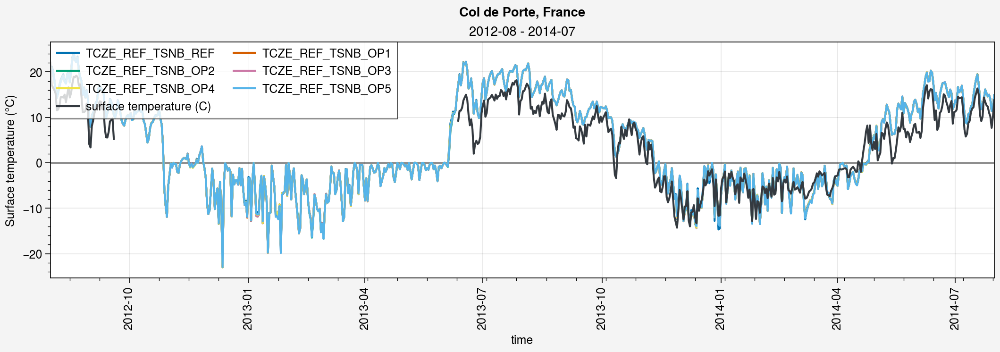

In [236]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.ts.sel(time=period)-273.15, label=label)
    
    # Obs
    axs[0].plot(ds_d_obs.ts.sel(time=period), color=color_obs)
    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')
    
    fig.suptitle(site_longname)


### Soil Temperature

<a list of 3 Line2D objects>

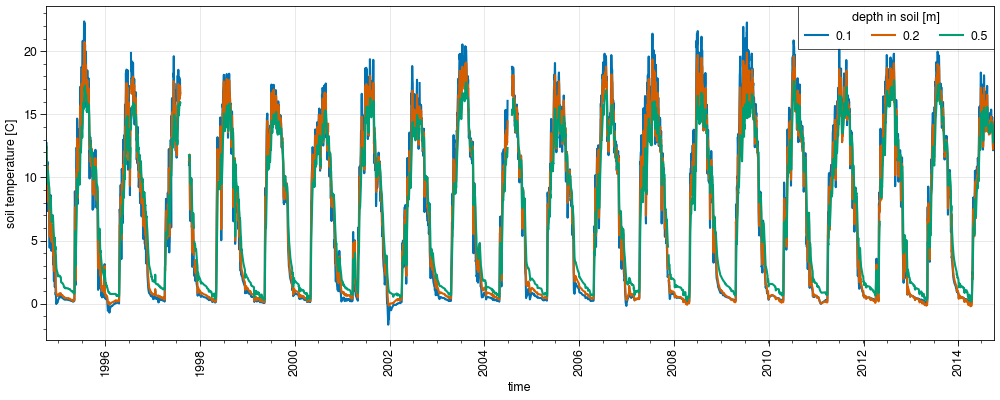

In [34]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsl.plot(hue='sdepth')

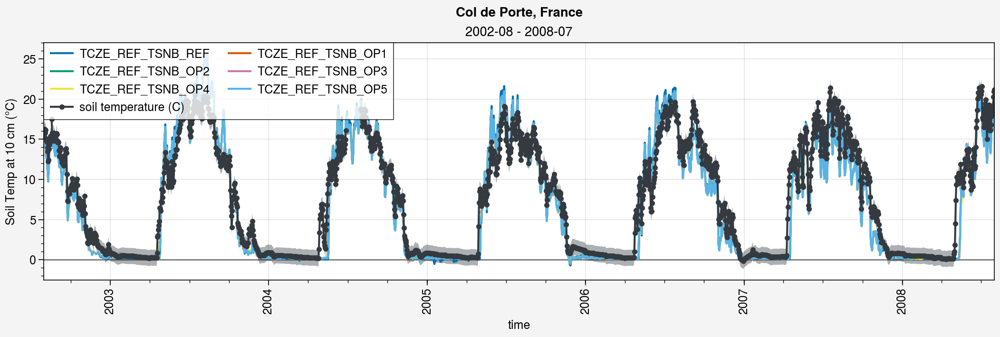

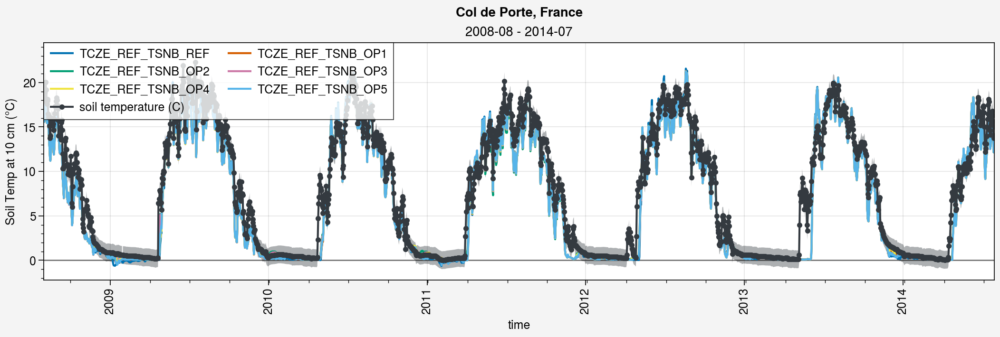

In [237]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.1
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth)-273.15, label=label)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


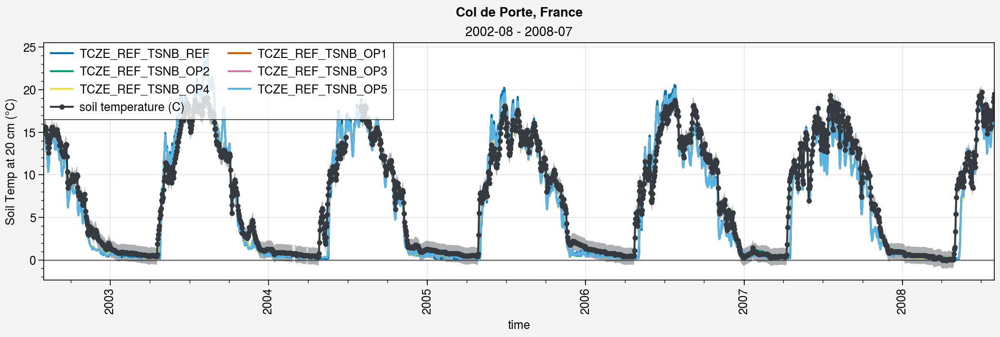

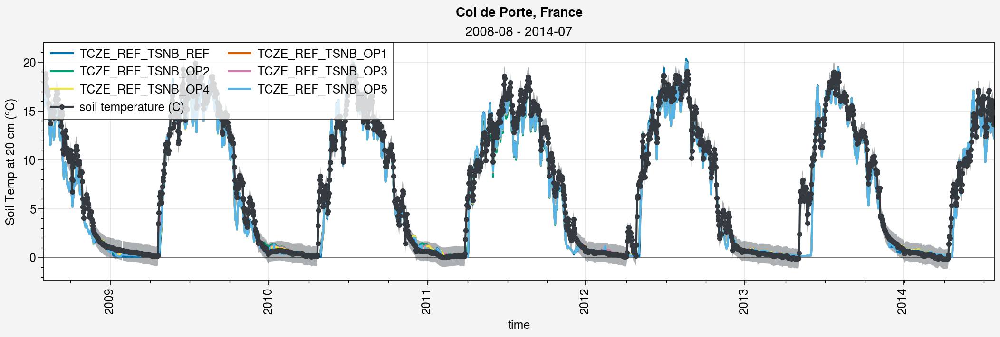

In [238]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.2
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=sdepth)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth, method='nearest')-273.15, label=label)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


### Snow temperature

In [37]:
from snowpyt import pit_class as pc

Theoric snow temperature within CLASSIC: https://cccma.gitlab.io/classic/snowHeatCond_8f90.html#details

In [38]:
import os

def sorted_directory_listing_with_os_listdir(directory):
    items = os.listdir(directory)
    sorted_items = sorted(items)
    return sorted_items

In [40]:
path_lejeune2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/CRYOBSCLIM_CDP'
mypath = path_lejeune2019+'/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/'
files = sorted_directory_listing_with_os_listdir(mypath)

In [49]:
tsn_obs_profile_list = []
depth_obs_profile_list = []
tsn_obs = []
dens_obs_profile_list = []
depth_dens_obs_profile_list = []
dens_obs = []
date_obs = []
for file in files:
    p = pc.Snowpit()
    p.caaml_file = path_lejeune2019+'/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/'+file
    p.import_caamlv6(print2term=False)
    # Temperature
    try:
        tsn_obs.append(np.trapz(p.temperature_profile.temp, x=-p.temperature_profile.depth)/(p.temperature_profile.depth[0]-p.temperature_profile.depth[-1]))
        tsn_obs_profile_list.append(list(p.temperature_profile.temp))
        depth_obs_profile_list.append(list(p.temperature_profile.depth))
    except AttributeError:
        tsn_obs.append(np.nan)
        tsn_obs_profile_list.append([np.nan])
        depth_obs_profile_list.append([np.nan])
                       
    # Density
    try:
        dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
        dens_obs_profile_list.append(list(p.density_profile.density))
        depth_dens_obs_profile_list.append(list(p.density_profile.depth))
    except AttributeError:
        dens_obs.append(np.nan)
        dens_obs_profile_list.append([np.nan])
        depth_dens_obs_profile_list.append([np.nan])

    date_obs.append(p.metadata.date)
    # p.plot(plot_order=['density', 'temperature', 'stratigraphy', 'hardness'])

/tmp/ipykernel_688017/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_688017/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_688017/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_688017/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_688017/2027953912.py:24: Runt

In [50]:
d = {'tsn': tsn_obs}
# df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_convert('Europe/Paris').tz_localize(None))
df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None) + pd.Timedelta(hours=2)) # to avoid the day light savings adjustment
df_tsn = df_tsn.dropna()
ds_tsn_loc = df_tsn.to_xarray()
ds_tsn_loc = ds_tsn_loc.rename({'index': 'time'})
ds_tsn_loc = ds_tsn_loc.reindex({'time': pd.date_range(ds_tsn_loc.tsn.time[0].values, ds_tsn_loc.tsn.time[-1].values, freq='H')})

In [51]:
d = {'tsn': tsn_obs}
df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None))
df_tsn = df_tsn.dropna()
ds_tsn = df_tsn.to_xarray()
ds_tsn = ds_tsn.rename({'index': 'time'})
ds_tsn = ds_tsn.reindex({'time': pd.date_range(ds_tsn.tsn.time[0].values, ds_tsn.tsn.time[-1].values, freq='H')})

In [58]:
ds_tsn_loc_d = ds_tsn_loc.tsn.resample(time='d').mean()
ds_tsn_d = ds_tsn.tsn.resample(time='d').mean()

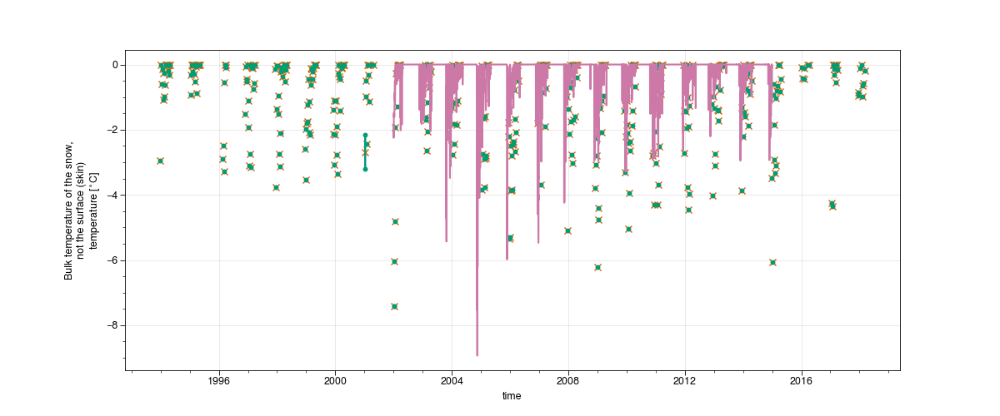

In [56]:
%matplotlib widget
plt.figure(figsize=(12,5))
# ds_hh.tsn.plot()
ds_tsn_loc.tsn.plot(marker='.')
ds_tsn_loc.tsn.resample(time='d').mean().plot(marker='x')
ds_tsn.tsn.plot(marker='.')
ds_d_list[0].tsn.plot()


#### Compute TSNBOT_TH for all timesteps
T(z) = 1/2az² + bz + c

z axis towards the bottom

In [111]:
d = {'tsnbot': [tsn_obs_profile[-1] for tsn_obs_profile in tsn_obs_profile_list]}
# df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_convert('Europe/Paris').tz_localize(None))
df_tsnbot = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None) + pd.Timedelta(hours=2)) # to avoid the day light savings adjustment
df_tsnbot = df_tsnbot.dropna()
ds_tsnbot_loc = df_tsnbot.to_xarray()
ds_tsnbot_loc = ds_tsnbot_loc.rename({'index': 'time'})
ds_tsnbot_loc = ds_tsnbot_loc.reindex({'time': pd.date_range(ds_tsnbot_loc.tsnbot.time[0].values, ds_tsnbot_loc.tsnbot.time[-1].values, freq='H')})

In [112]:
d = {'tsnbot': [tsn_obs_profile[-1] for tsn_obs_profile in tsn_obs_profile_list]}
df_tsnbot = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None))
df_tsnbot = df_tsnbot.dropna()
ds_tsnbot = df_tsnbot.to_xarray()
ds_tsnbot = ds_tsnbot.rename({'index': 'time'})
ds_tsnbot = ds_tsnbot.reindex({'time': pd.date_range(ds_tsnbot.tsnbot.time[0].values, ds_tsnbot.tsnbot.time[-1].values, freq='H')})

In [113]:
ds_tsnbot_loc_d = ds_tsnbot_loc.tsnbot.resample(time='d').mean()
ds_tsnbot_d = ds_tsnbot.tsnbot.resample(time='d').mean()

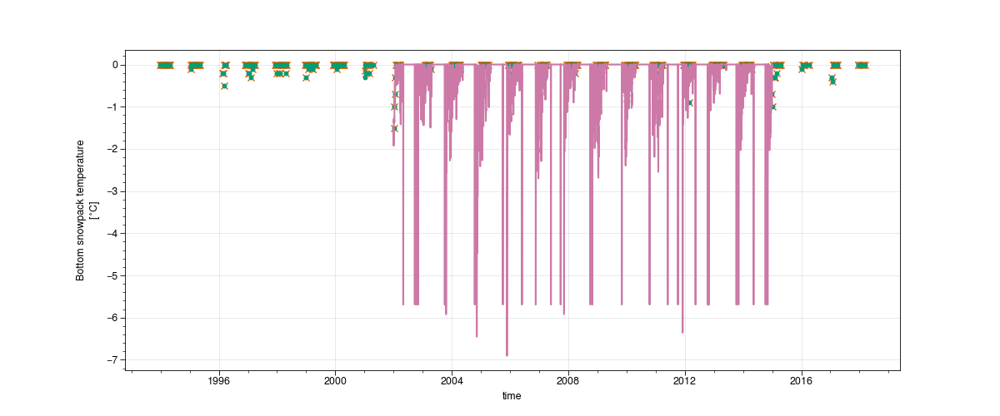

In [114]:
%matplotlib widget
plt.figure(figsize=(12,5))
# ds_hh.tsn.plot()
ds_tsnbot_loc.tsnbot.plot(marker='.')
ds_tsnbot_loc_d.plot(marker='x')
ds_tsnbot.tsnbot.plot(marker='.')
ds_d_list[0].tsnbot.plot()


In [115]:
TSNBOT_obs_day = ds_tsnbot_d

In [135]:
ds_h_eval_lejeune2019 = xr.open_dataset(path_lejeune2019+'/CRYOBSCLIM.CDP.2018.HourlySnow.nc')
ds_d_eval_lejeune2019 = xr.open_dataset(path_lejeune2019+'/CRYOBSCLIM.CDP.2018.MetSnowDaily.nc')
ds_h_eval_lejeune2019

<xarray.Dataset> Size: 144MB
Dimensions:                   (time: 254208)
Coordinates:
  * time                      (time) datetime64[ns] 2MB 1993-08-01 ... 2022-0...
Data variables: (12/70)
    Soil_temperature_10cm     (time) float64 2MB ...
    Soil_temperature_20cm     (time) float64 2MB ...
    Soil_temperature_50cm     (time) float64 2MB ...
    Runoff_5m2                (time) float64 2MB ...
    Runoff_1m2                (time) float64 2MB ...
    Snow_depth                (time) float64 2MB ...
    ...                        ...
    Soil_moisture_10cm_2      (time) float64 2MB ...
    Soil_moisture_10cm_3      (time) float64 2MB ...
    Soil_moisture_20cm_1      (time) float64 2MB ...
    Soil_moisture_20cm_2      (time) float64 2MB ...
    Soil_moisture_30cm_1      (time) float64 2MB ...
    Soil_moisture_30cm_2      (time) float64 2MB ...
Attributes:
    history:  Thu Feb  9 11:25:20 2023: ncrcat CDP_hourly_19930801_20170731.n...
    NCO:      netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, C...

## Check soil moisture order of magnitude

Otherwise we would need to use lejeune forcing to get data until 2019  
(for now use of Menard that sill uses Brun2012)

In [139]:
# Very long just to test (or need to load before / use only 1 var)
a = ds_h_eval_lejeune2019.resample(time='d').mean()
a

<xarray.Dataset> Size: 6MB
Dimensions:                   (time: 10592)
Coordinates:
  * time                      (time) datetime64[ns] 85kB 1993-08-01 ... 2022-...
Data variables: (12/70)
    Soil_temperature_10cm     (time) float64 85kB 290.5 291.0 ... 291.0 291.2
    Soil_temperature_20cm     (time) float64 85kB 289.9 290.2 ... 290.6 290.8
    Soil_temperature_50cm     (time) float64 85kB 288.6 288.6 ... 290.2 290.1
    Runoff_5m2                (time) float64 85kB 0.01667 0.02083 ... 0.0125
    Runoff_1m2                (time) float64 85kB 0.05 0.03333 ... 0.0125
    Snow_depth                (time) float64 85kB nan nan nan ... 0.0 0.0 0.0
    ...                        ...
    Soil_moisture_10cm_2      (time) float64 85kB nan nan nan ... 0.133 0.1297
    Soil_moisture_10cm_3      (time) float64 85kB nan nan ... 0.06507 0.06503
    Soil_moisture_20cm_1      (time) float64 85kB nan nan nan ... 0.2244 0.2245
    Soil_moisture_20cm_2      (time) float64 85kB nan nan nan ... 0.2135 0.2104
    Soil_moisture_30cm_1      (time) float64 85kB nan nan nan ... 0.2489 0.2496
    Soil_moisture_30cm_2      (time) float64 85kB nan nan nan ... 0.3401 0.3064
Attributes:
    history:  Thu Feb  9 11:25:20 2023: ncrcat CDP_hourly_19930801_20170731.n...
    NCO:      netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, C...

<a list of 1 Line2D objects>

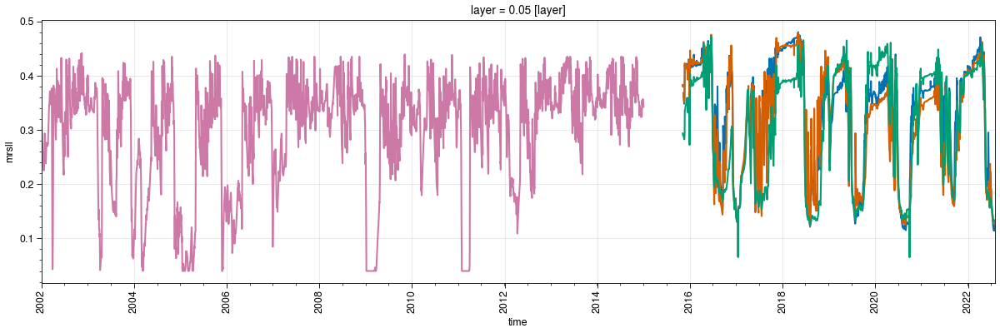

In [151]:
%matplotlib widget 

fig, axs = pplt.subplots(figsize=(12, 4))
a.Soil_moisture_5cm_1.plot()
a.Soil_moisture_5cm_2.plot()
a.Soil_moisture_5cm_3.plot()
(ds_d_list[0].mrsll.sel(layer=0.05, method='nearest')/100).plot()

<a list of 1 Line2D objects>

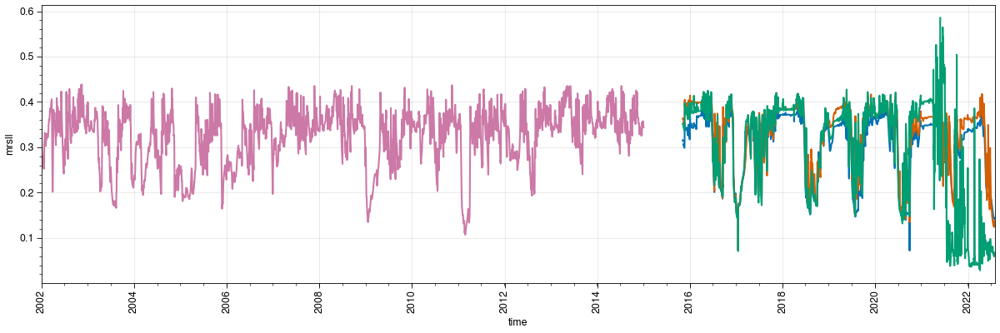

In [152]:
%matplotlib widget 

fig, axs = pplt.subplots(figsize=(12, 4))
a.Soil_moisture_10cm_1.plot()
a.Soil_moisture_10cm_2.plot()
a.Soil_moisture_10cm_3.plot()
(0.5*(ds_d_list[0].mrsll.sel(layer=0.05, method='nearest')/100) + \
     0.5*(ds_d_list[0].mrsll.sel(layer=0.15, method='nearest')/100)).plot()

<a list of 1 Line2D objects>

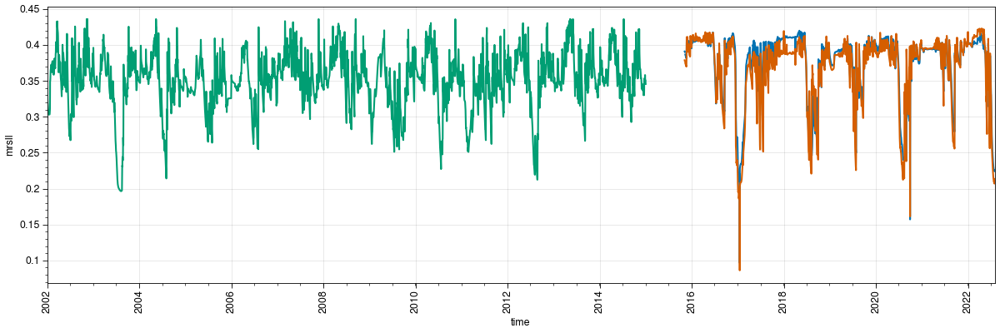

In [155]:
%matplotlib widget 

fig, axs = pplt.subplots(figsize=(12, 4))
a.Soil_moisture_20cm_1.plot()
a.Soil_moisture_20cm_2.plot()
# a.Soil_moisture_20cm_3.plot()
(0.5*(ds_d_list[0].mrsll.sel(layer=0.15, method='nearest')/100) + \
     0.5*(ds_d_list[0].mrsll.sel(layer=0.25, method='nearest')/100)).plot()

<a list of 1 Line2D objects>

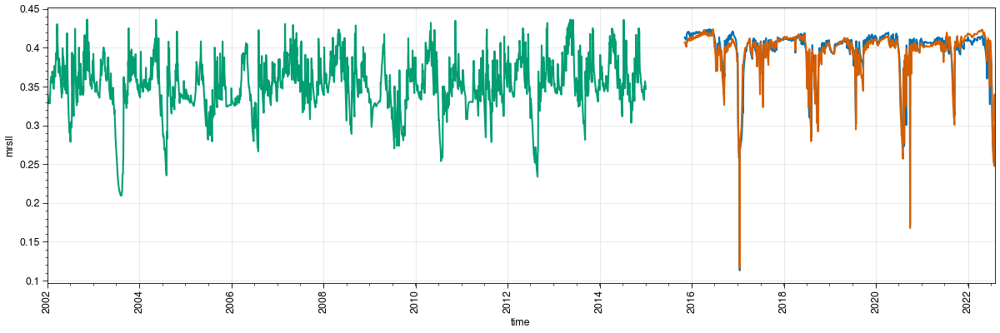

In [156]:
%matplotlib widget 

fig, axs = pplt.subplots(figsize=(12, 4))
a.Soil_moisture_30cm_1.plot()
a.Soil_moisture_30cm_2.plot()
# a.Soil_moisture_20cm_3.plot()
(0.5*(ds_d_list[0].mrsll.sel(layer=0.25, method='nearest')/100) + \
     0.5*(ds_d_list[0].mrsll.sel(layer=0.35, method='nearest')/100)).plot()

## All 

In [239]:
labels

['TCZE_REF_TSNB_REF',
 'TCZE_REF_TSNB_OP1',
 'TCZE_REF_TSNB_OP2',
 'TCZE_REF_TSNB_OP3',
 'TCZE_REF_TSNB_OP4',
 'TCZE_REF_TSNB_OP5']

In [246]:

column_indexes = [['Obs'] + labels]

row_indexes = [['snd_auto', 'snwdens', 'ts', 'tsn', 'tsnbot', 'tsl_10', 'tsl_20', 'tsl_50'], ['ME', 'RMSE', 'NRMSE']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=column_indexes)
df_metrics.loc[:, ('Obs', slice(None))] = 0
df_metrics

Obs TCZE_REF_TSNB_REF TCZE_REF_TSNB_OP1 TCZE_REF_TSNB_OP2  \
snd_auto ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
snwdens  ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
ts       ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
tsn      ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
tsnbot   ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
tsl_10   ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
tsl_20   ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   
tsl_50   ME      0               NaN               NaN               NaN   
         RMSE    0               NaN               NaN               NaN   
         NRMSE   0               NaN               NaN               NaN   

               TCZE_REF_TSNB_OP3 TCZE_REF_TSNB_OP4 TCZE_REF_TSNB_OP5  
snd_auto ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
snwdens  ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
ts       ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
tsn      ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
tsnbot   ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
tsl_10   ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
tsl_20   ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN  
tsl_50   ME                  NaN               NaN               NaN  
         RMSE                NaN               NaN               NaN  
         NRMSE               NaN               NaN               NaN

In [178]:
# ds_d_obs = ds_d_obs.drop_vars('snwdens')
# ds_d_obs

<xarray.Dataset> Size: 453kB
Dimensions:         (time: 2176, sdepth: 5, sheight: 10)
Coordinates:
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
  * time            (time) datetime64[ns] 17kB 2013-07-11 ... 2019-06-25
Data variables:
    snd_auto        (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 17kB 0.1815 0.1357 0.1493 ... 0.1625 0.1964
    flag_albs_ERA5  (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    ts              (time) float64 17kB 11.03 5.161 6.706 ... 5.245 4.045 4.336
    mrsll           (time, sdepth) float64 87kB 0.1981 0.4431 ... 0.08873 0.066
    tsl             (time, sdepth) float64 87kB 6.497 3.928 1.357 ... 0.79 -0.3
    tsnl            (time, sheight) float64 174kB nan nan nan ... nan nan nan
    tsn             (time) float64 17kB nan nan nan nan nan ... nan nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

<a list of 1 Line2D objects>

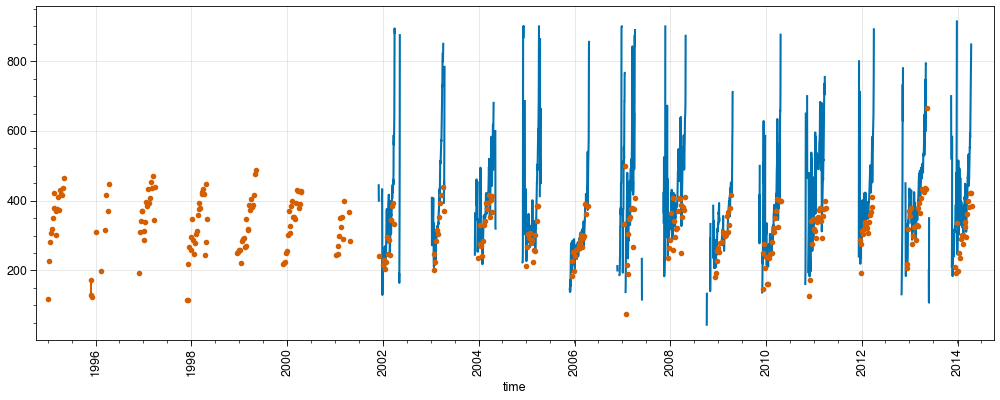

In [189]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10, 4))
(ds_d_obs.snw_auto/ds_d_obs.snd_auto).where((ds_d_obs.snw_auto/ds_d_obs.snd_auto) < 917).where((ds_d_obs.snw_auto/ds_d_obs.snd_auto) > 0).plot()
(ds_d_obs.snw_man/ds_d_obs.snd_man).plot(marker='.')
# ds_d_obs.snwdens_auto.plot(marker='x')

In [190]:
ds_d_obs = ds_d_obs.assign({
    'snwdens_auto': ('time', 
                     (ds_d_obs.snw_auto/ds_d_obs.snd_auto).where(
                         (ds_d_obs.snw_auto/ds_d_obs.snd_auto) < 917).where(
                         (ds_d_obs.snw_auto/ds_d_obs.snd_auto) > 0).values)})
ds_d_obs = ds_d_obs.assign({'snwdens_man': ('time', (ds_d_obs.snw_man/ds_d_obs.snd_man).values)})
ds_d_obs

<xarray.Dataset> Size: 380kB
Dimensions:       (sdepth: 3, time: 7306)
Coordinates:
  * sdepth        (sdepth) float32 12B 0.1 0.2 0.5
  * time          (time) datetime64[ns] 58kB 1994-10-01 ... 2014-10-01
Data variables:
    albs          (time) float32 29kB nan nan nan nan ... 0.2152 0.2063 nan
    snd_auto      (time) float32 29kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 nan
    snd_man       (time) float32 29kB nan nan nan nan nan ... nan nan nan nan
    snw_auto      (time) float32 29kB nan nan nan nan nan ... 0.0 0.0 0.0 nan
    snw_man       (time) float32 29kB nan nan nan nan nan ... nan nan nan nan
    ts            (time) float32 29kB 10.98 10.66 6.542 ... 9.938 10.5 8.029
    tsl           (time, sdepth) float32 88kB 12.46 12.15 12.26 ... 12.83 12.8
    snwdens_man   (time) float32 29kB nan nan nan nan nan ... nan nan nan nan
    snwdens_auto  (time) float32 29kB nan nan nan nan nan ... nan nan nan nan

In [212]:
# https://essd.copernicus.org/articles/11/71/2019/
a = 0.1/ds_d_obs.snd_auto # 10 cm error
b = 25/ds_d_obs.snw_auto # 25 kg/m2

unc_snwdens_auto = ds_d_obs.snwdens_auto * xr.apply_ufunc(np.sqrt, a**2 + b**2)

In [214]:
unc_snwdens_auto.mean() 

<xarray.DataArray ()> Size: 4B
array(164.64026, dtype=float32)

In [215]:
unc_snwdens_auto.median() 

<xarray.DataArray ()> Size: 8B
array(72.53713226)

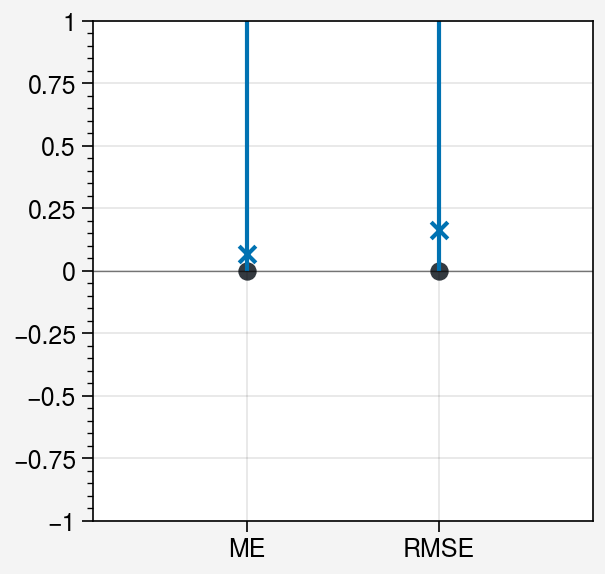

In [221]:
%matplotlib inline
fig, axs = pplt.subplots()

ax = axs[0]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0) != 'Obs'], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')], color=color_obs)
ax.vlines([0, 1], 0, 1)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)
ax.format(xlim=(-0.8, 1.8), ylim=(-1,1))

In [211]:
unc_snwdens_auto.mean()

<xarray.DataArray ()> Size: 4B
array(164.64026, dtype=float32)

In [252]:
ds_d.snd.sel(time=period).where(mask_sd).std()

<xarray.DataArray 'snd' ()> Size: 8B
array(0.36241981)

In [250]:
df_metrics.loc[('snd_auto', 'RMSE'), label]

TCZE_REF_TSNB_REF    0.16341633326590937
Name: (snd_auto, RMSE), dtype: object

In [254]:
df_metrics.loc[('snd_auto', 'RMSE'), label]/ds_d.snd.sel(time=period).where(mask_sd).std().values

TCZE_REF_TSNB_REF    0.450903
Name: (snd_auto, RMSE), dtype: object

/tmp/ipykernel_688017/3915999165.py:73: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/3915999165.py:73: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/3915999165.py:73: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked 

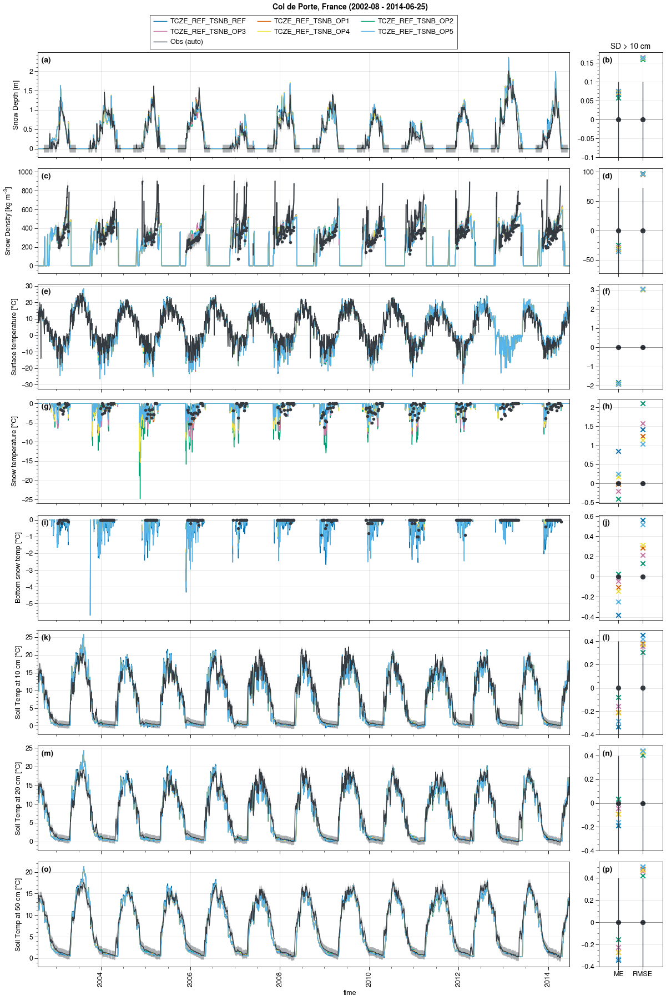

In [278]:
%matplotlib widget
color_obs = 'gray8'
period = slice('2002-08', '2014-06-25')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
# fig, axs = pplt.subplots(nrows=8, ncols=2, refaspect=6, refwidth=8, sharey=0, wratios=(1, 0.12))
fig, axs = pplt.subplots(nrows=8, ncols=2, refaspect=6, sharey=0, wratios=(1, 0.12), figsize=(12,18))

k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snd.sel(time=period), label=label, lw=1)
    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'ME'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'NRMSE'), label] = df_metrics.loc[('snd_auto', 'RMSE'), label]/ \
                                                    ds_d_obs.snd_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_d_obs.snd_man.sel(time=period), color=color_obs, label='Obs (man)', lw=1, marker='.')ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.1, 0.1, lw=1, color=color_obs)
ax.format(xlim=(-0.8, 1.8), title='SD > 10 cm')
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snwdens.sel(time=period), label=label, lw=1)
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'ME'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'NRMSE'), label] = df_metrics.loc[('snwdens', 'RMSE'), label]/ \
                                                    ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values+unc_snwdens_auto.median().values, axis=0),
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values-unc_snwdens_auto.median().values, axis=0),), axis=0)
ax.plot(ds_d_obs.snwdens_auto.sel(time=period), shadedata=shadedata, color=color_obs)
ax.plot(ds_d_obs.snwdens_man.sel(time=period), color=color_obs, marker='.')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -unc_snwdens_auto.median(), unc_snwdens_auto.median(), lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1)
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'ME'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'NRMSE'), label] = df_metrics.loc[('ts', 'RMSE'), label]/ \
                                                    ds_d_obs.ts.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsn.sel(time=period), label=label, lw=1)
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'ME'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'NRMSE'), label] = df_metrics.loc[('tsn', 'RMSE'), label]/ \
                                                    ds_tsn_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsn_d.sel(time=period), color=color_obs, lw=1, marker='.')
ax.format(ylabel='Snow temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsnbot.sel(time=period).where(ds_d.snd.sel(time=period) > 0.1).where(mask_sd), label=label, lw=1)
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'ME'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'NRMSE'), label] = df_metrics.loc[('tsnbot', 'RMSE'), label]/ \
                                                    ds_tsnbot_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsnbot_d.sel(time=period), color=color_obs, lw=1, marker='.') 
ax.format(ylabel='Bottom snow temp [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_10', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'NRMSE'), label] = df_metrics.loc[('tsl_10', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd).std().values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs, label='Obs (10 cm)', lw=1)
ax.format(ylabel='Soil Temp at 10 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_10'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_10', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)




k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_20', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'NRMSE'), label] = df_metrics.loc[('tsl_20', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.2), shadedata=shadedata, color=color_obs, label='Obs (20 cm)', lw=1)
ax.format(ylabel='Soil Temp at 20 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_20'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_20', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_50', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'NRMSE'), label] = df_metrics.loc[('tsl_50', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.5), shadedata=shadedata, color=color_obs, label='Obs (50 cm)', lw=1)
ax.format(ylabel='Soil Temp at 50 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_50'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_50', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=3, loc='t')


# fig.save('img/'+site+'_TCZE_REF_TSNB_ALL_2002-2014.pdf')

/tmp/ipykernel_688017/1292215170.py:73: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/1292215170.py:73: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/1292215170.py:73: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked 

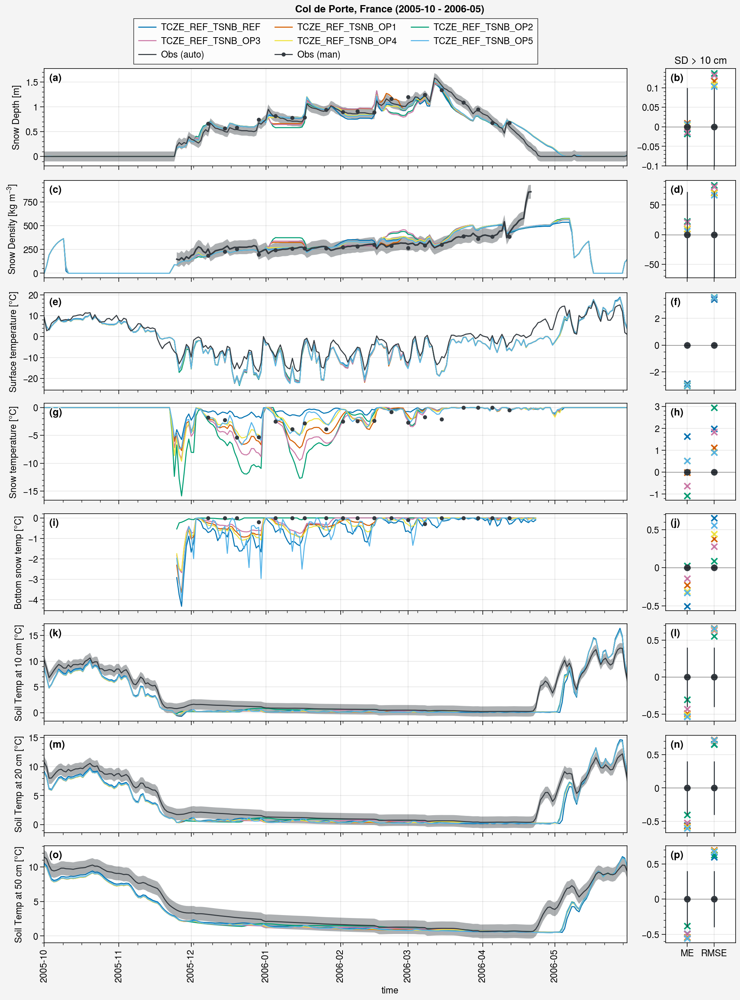

In [294]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2005-10', '2006-05')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=8, ncols=2, refaspect=6, refwidth=8, sharey=0, wratios=(1, 0.12))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snd.sel(time=period), label=label, lw=1)
    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'ME'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'NRMSE'), label] = df_metrics.loc[('snd_auto', 'RMSE'), label]/ \
                                                    ds_d_obs.snd_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_d_obs.snd_man.sel(time=period), color=color_obs, label='Obs (man)', lw=1, marker='.')

ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.1, 0.1, lw=1, color=color_obs)
ax.format(xlim=(-0.8, 1.8), title='SD > 10 cm')
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snwdens.sel(time=period), label=label, lw=1)
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'ME'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'NRMSE'), label] = df_metrics.loc[('snwdens', 'RMSE'), label]/ \
                                                    ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values+unc_snwdens_auto.median().values, axis=0),
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values-unc_snwdens_auto.median().values, axis=0),), axis=0)
ax.plot(ds_d_obs.snwdens_auto.sel(time=period), shadedata=shadedata, color=color_obs)
ax.plot(ds_d_obs.snwdens_man.sel(time=period), color=color_obs, marker='.')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -unc_snwdens_auto.median(), unc_snwdens_auto.median(), lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1)
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'ME'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'NRMSE'), label] = df_metrics.loc[('ts', 'RMSE'), label]/ \
                                                    ds_d_obs.ts.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsn.sel(time=period), label=label, lw=1)
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'ME'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'NRMSE'), label] = df_metrics.loc[('tsn', 'RMSE'), label]/ \
                                                    ds_tsn_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsn_d.sel(time=period), color=color_obs, lw=1, marker='.')
ax.format(ylabel='Snow temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsnbot.sel(time=period).where(ds_d.snd.sel(time=period) > 0.1).where(mask_sd), label=label, lw=1)
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'ME'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'NRMSE'), label] = df_metrics.loc[('tsnbot', 'RMSE'), label]/ \
                                                    ds_tsnbot_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsnbot_d.sel(time=period), color=color_obs, lw=1, marker='.') 
ax.format(ylabel='Bottom snow temp [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_10', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'NRMSE'), label] = df_metrics.loc[('tsl_10', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd).std().values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs, label='Obs (10 cm)', lw=1)
ax.format(ylabel='Soil Temp at 10 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_10'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_10', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)




k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_20', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'NRMSE'), label] = df_metrics.loc[('tsl_20', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.2), shadedata=shadedata, color=color_obs, label='Obs (20 cm)', lw=1)
ax.format(ylabel='Soil Temp at 20 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_20'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_20', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_50', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'NRMSE'), label] = df_metrics.loc[('tsl_50', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.5), shadedata=shadedata, color=color_obs, label='Obs (50 cm)', lw=1)
ax.format(ylabel='Soil Temp at 50 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_50'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_50', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=3, loc='t')


# fig.save('img/'+site+'_TCZE_REF_TSNB_ALL_'+period.start[0:4]+'-'+period.stop[0:4]+'.pdf')

/tmp/ipykernel_688017/1974111089.py:71: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/1974111089.py:71: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/1974111089.py:71: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked 

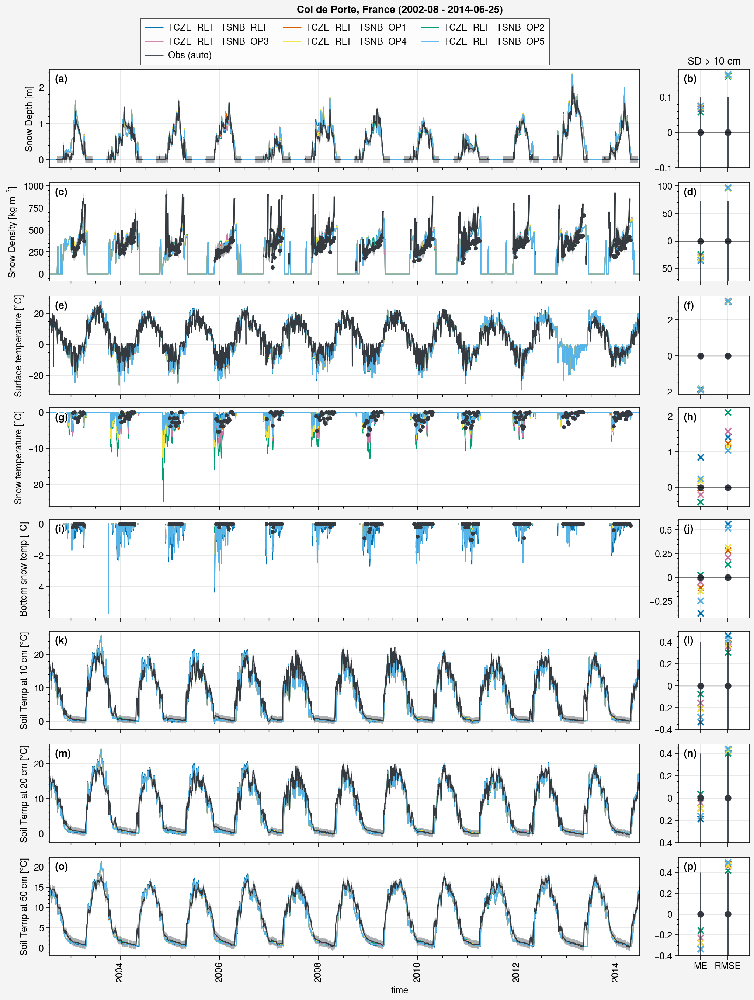

In [289]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2002-08', '2014-06-25')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=8, ncols=2, refaspect=6, refwidth=8, sharey=0, wratios=(1, 0.12))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snd.sel(time=period), label=label, lw=1)
    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'ME'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'NRMSE'), label] = df_metrics.loc[('snd_auto', 'RMSE'), label]/ \
                                                    ds_d_obs.snd_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_d_obs.snd_man.sel(time=period), color=color_obs, label='Obs (man)', lw=1, marker='.')

ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.1, 0.1, lw=1, color=color_obs)
ax.format(xlim=(-0.8, 1.8), title='SD > 10 cm')
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snwdens.sel(time=period), label=label, lw=1)
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'ME'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'NRMSE'), label] = df_metrics.loc[('snwdens', 'RMSE'), label]/ \
                                                    ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values+unc_snwdens_auto.median().values, axis=0),
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values-unc_snwdens_auto.median().values, axis=0),), axis=0)
ax.plot(ds_d_obs.snwdens_auto.sel(time=period), shadedata=shadedata, color=color_obs)
ax.plot(ds_d_obs.snwdens_man.sel(time=period), color=color_obs, marker='.')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -unc_snwdens_auto.median(), unc_snwdens_auto.median(), lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1)
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'ME'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'NRMSE'), label] = df_metrics.loc[('ts', 'RMSE'), label]/ \
                                                    ds_d_obs.ts.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsn.sel(time=period), label=label, lw=1)
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'ME'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'NRMSE'), label] = df_metrics.loc[('tsn', 'RMSE'), label]/ \
                                                    ds_tsn_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsn_d.sel(time=period), color=color_obs, lw=1, marker='.')
ax.format(ylabel='Snow temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsnbot.sel(time=period).where(ds_d.snd.sel(time=period) > 0.1).where(mask_sd), label=label, lw=1)
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'ME'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'NRMSE'), label] = df_metrics.loc[('tsnbot', 'RMSE'), label]/ \
                                                    ds_tsnbot_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsnbot_d.sel(time=period), color=color_obs, lw=1, marker='.') 
ax.format(ylabel='Bottom snow temp [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_10', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'NRMSE'), label] = df_metrics.loc[('tsl_10', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd).std().values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs, label='Obs (10 cm)', lw=1)
ax.format(ylabel='Soil Temp at 10 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_10'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_10', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)




k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_20', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'NRMSE'), label] = df_metrics.loc[('tsl_20', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.2), shadedata=shadedata, color=color_obs, label='Obs (20 cm)', lw=1)
ax.format(ylabel='Soil Temp at 20 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_20'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_20', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_50', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'NRMSE'), label] = df_metrics.loc[('tsl_50', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.5), shadedata=shadedata, color=color_obs, label='Obs (50 cm)', lw=1)
ax.format(ylabel='Soil Temp at 50 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_50'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_50', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=3, loc='t')


# fig.save('img/'+site+'_TCZE_REF_TSNB_ALL_'+period.start[0:4]+'-'+period.stop[0:4]+'.pdf')

/tmp/ipykernel_688017/2975173865.py:72: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/2975173865.py:72: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
/tmp/ipykernel_688017/2975173865.py:72: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked 

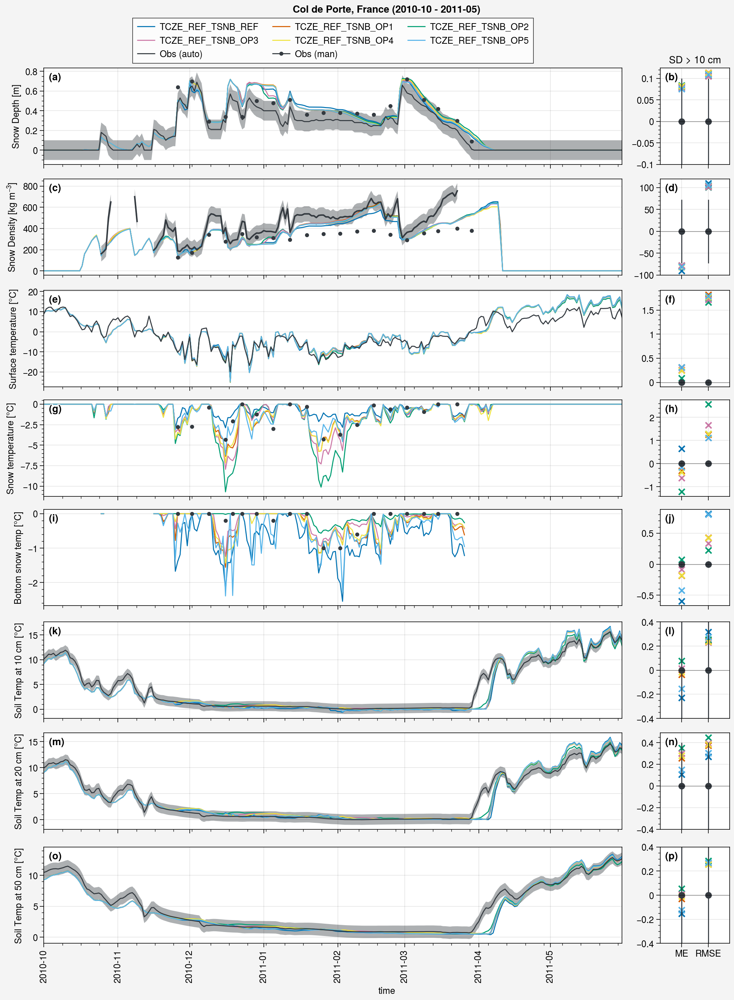

In [293]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2010-10', '2011-05')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=8, ncols=2, refaspect=6, refwidth=8, sharey=0, wratios=(1, 0.12))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snd.sel(time=period), label=label, lw=1)
    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'ME'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'NRMSE'), label] = df_metrics.loc[('snd_auto', 'RMSE'), label]/ \
                                                    ds_d_obs.snd_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_d_obs.snd_man.sel(time=period), color=color_obs, label='Obs (man)', lw=1, marker='.')
ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.1, 0.1, lw=1, color=color_obs)
ax.format(xlim=(-0.8, 1.8), title='SD > 10 cm')
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snwdens.sel(time=period), label=label, lw=1)
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'ME'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'NRMSE'), label] = df_metrics.loc[('snwdens', 'RMSE'), label]/ \
                                                    ds_d_obs.snwdens_auto.sel(time=period).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values+unc_snwdens_auto.median().values, axis=0),
    np.expand_dims(ds_d_obs.snwdens_auto.sel(time=period).values-unc_snwdens_auto.median().values, axis=0),), axis=0)
ax.plot(ds_d_obs.snwdens_auto.sel(time=period), shadedata=shadedata, color=color_obs)
ax.plot(ds_d_obs.snwdens_man.sel(time=period), color=color_obs, marker='.')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -unc_snwdens_auto.median(), unc_snwdens_auto.median(), lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1)
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'ME'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'NRMSE'), label] = df_metrics.loc[('ts', 'RMSE'), label]/ \
                                                    ds_d_obs.ts.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsn.sel(time=period), label=label, lw=1)
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'ME'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_tsn_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'NRMSE'), label] = df_metrics.loc[('tsn', 'RMSE'), label]/ \
                                                    ds_tsn_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsn_d.sel(time=period), color=color_obs, lw=1, marker='.')
ax.format(ylabel='Snow temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsnbot.sel(time=period).where(ds_d.snd.sel(time=period) > 0.1).where(mask_sd), label=label, lw=1)
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'ME'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      ds_tsnbot_d.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'NRMSE'), label] = df_metrics.loc[('tsnbot', 'RMSE'), label]/ \
                                                    ds_tsnbot_d.sel(time=period).where(mask_sd).std().values
    
# Obs
ax.plot(ds_tsnbot_d.sel(time=period), color=color_obs, lw=1, marker='.') 
ax.format(ylabel='Bottom snow temp [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')][:-1], color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_10', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_10', 'NRMSE'), label] = df_metrics.loc[('tsl_10', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.1).where(mask_sd).std().values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs, label='Obs (10 cm)', lw=1)
ax.format(ylabel='Soil Temp at 10 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_10'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_10', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)




k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_20', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.2).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_20', 'NRMSE'), label] = df_metrics.loc[('tsl_20', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.2).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.2)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.2), shadedata=shadedata, color=color_obs, label='Obs (20 cm)', lw=1)
ax.format(ylabel='Soil Temp at 20 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_20'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_20', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)



k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5)-273.15, label=label, lw=1)
    df_metrics.loc[('tsl_50', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.5).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_50', 'NRMSE'), label] = df_metrics.loc[('tsl_50', 'RMSE'), label]/ \
                                                    ds_d_obs.tsl.sel(time=period, sdepth=0.5).where(mask_sd).std().values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.5)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.5), shadedata=shadedata, color=color_obs, label='Obs (50 cm)', lw=1)
ax.format(ylabel='Soil Temp at 50 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_50'), df_metrics.columns.get_level_values(0) != 'Obs'][:-1], marker='x')
ax.scatter(df_metrics.loc[('tsl_50', 'Obs')][:-1], color=color_obs)
ax.vlines([0, 1], -0.4, 0.4, lw=1, color=color_obs)
ax.hlines(0, -0.8, 1.8, color='k', lw=0.5, alpha=0.5)


# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=3, loc='t')


# fig.save('img/'+site+'_TCZE_REF_TSNB_ALL_'+period.start[0:4]+'-'+period.stop[0:4]+'.pdf')

In [287]:
period.start[0:4]

'2005'

In [273]:
df_metrics

Obs     TCZE_REF_TSNB_REF      TCZE_REF_TSNB_OP1  \
snd_auto ME      0   0.06812598984959295    0.07618242362816897   
         RMSE    0   0.16341633326590937    0.16365105912436753   
         NRMSE   0              0.442634                0.44327   
snwdens  ME      0    -35.13355416196061    -31.074720889553134   
         RMSE    0      97.4072982233863      96.02839622755364   
         NRMSE   0              0.760081               0.749321   
ts       ME      0   -1.8301367985537225    -1.8976518913646656   
         RMSE    0    3.0127533196246805     3.0638352838414895   
         NRMSE   0              0.652997               0.664069   
tsn      ME      0    0.8424554137648459  -0.015366453784726782   
         RMSE    0    1.4119724407299465     1.2390722309826647   
         NRMSE   0              1.003514               0.880631   
tsnbot   ME      0  -0.38102621225081046   -0.10713825030978137   
         RMSE    0    0.5637048909837076     0.2850739804853789   
         NRMSE   0              3.677321               1.859676   
tsl_10   ME      0   -0.3320547576420757   -0.20666559078367583   
         RMSE    0     0.455398524382644    0.38380588926856957   
         NRMSE   0              0.684797               0.577141   
tsl_20   ME      0  -0.18771255195873215   -0.09140730512449438   
         RMSE    0   0.43976502288308333    0.43791438056783355   
         NRMSE   0               0.50498               0.502855   
tsl_50   ME      0  -0.33862510644453625    -0.2717198352476717   
         RMSE    0    0.5016067554442681    0.48148081204474186   
         NRMSE   0                0.4382               0.420619   

                   TCZE_REF_TSNB_OP2      TCZE_REF_TSNB_OP3  \
snd_auto ME      0.05791237298164582    0.07070368759034926   
         RMSE    0.16019185248510798     0.1648021837383175   
         NRMSE              0.433901               0.446388   
snwdens  ME       -24.40463425487748     -28.70420188316244   
         RMSE       96.9671290639422      96.75898911832488   
         NRMSE              0.756646               0.755022   
ts       ME       -1.901281802363878     -1.905661704047695   
         RMSE     3.0236224600392085     3.0584618833367347   
         NRMSE              0.655353               0.662904   
tsn      ME      -0.4046657643752563   -0.19717480279922533   
         RMSE     2.0991844142912415     1.5772410050606704   
         NRMSE              1.491928               1.120973   
tsnbot   ME     0.026481979055986246  -0.045943953199089366   
         RMSE    0.13426359348502057     0.2145836704939398   
         NRMSE              0.875867               1.399834   
tsl_10   ME     -0.07646020969686124    -0.1545923075669227   
         RMSE    0.30640040147088127     0.3580558428925168   
         NRMSE              0.460744                0.53842   
tsl_20   ME      0.03565455349972749  -0.041667432252423475   
         RMSE    0.40385617180895067     0.4307033332201768   
         NRMSE              0.463746               0.494574   
tsl_50   ME     -0.15629140907411415   -0.22672498962474757   
         RMSE     0.4241721765365426    0.46247018423410585   
         NRMSE              0.370554               0.404011   

                   TCZE_REF_TSNB_OP4     TCZE_REF_TSNB_OP5  
snd_auto ME       0.0728446900568553   0.07524401080119318  
         RMSE    0.16245992765983946   0.16456403408006115  
         NRMSE              0.440044              0.445743  
snwdens  ME       -30.26425097476651    -34.46354251167869  
         RMSE      96.21199453987836     96.66013116711576  
         NRMSE              0.750754              0.754251  
ts       ME       -1.874746386483336   -1.8952475231912191  
         RMSE      3.026526726724917     3.064825454907927  
         NRMSE              0.655982              0.664283  
tsn      ME      0.18157170687008475   0.24666837809216796  
         RMSE     1.1387780788315984    1.0434104647250042  
         NRMSE               0.

In [276]:
df_metrics.groupby(level=1).mean()

,Obs,TCZE_REF_TSNB_REF,TCZE_REF_TSNB_OP1,TCZE_REF_TSNB_OP2,TCZE_REF_TSNB_OP3,TCZE_REF_TSNB_OP4,TCZE_REF_TSNB_OP5
ME,0.0,-4.661566,-4.198561,-3.352911,-3.900658,-4.075603,-4.632412
NRMSE,0.0,1.020566,0.762198,0.688592,0.727766,0.773481,0.946117
RMSE,0.0,12.994489,12.760404,12.939853,12.878163,12.766582,12.851708
